## End-to-End class dog breed classification
1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

4. Features
Some information about the data:

We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
There are 120 breeds of dogs (this means there are 120 different classes).
There are around 10,000+ images in the training set (these images have labels).
There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np

# Check for GPU availability
if tf.config.list_physical_devices("GPU"):
  print("sd")
else:
  print("Sad")

sd


In [ ]:
## Getting our data ready (turning into tensors)
# check out the labels of our data
import pandas as pd
label_csv = pd.read_csv("/content/drive/MyDrive/dog-vision/dog-breed-identification/labels.csv")
print(label_csv.describe())
label_csv.head

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


<bound method NDFrame.head of                                      id                     breed
0      000bec180eb18c7604dcecc8fe0dba07               boston_bull
1      001513dfcb2ffafc82cccf4d8bbaba97                     dingo
2      001cdf01b096e06d78e9e5112d419397                  pekinese
3      00214f311d5d2247d5dfe4fe24b2303d                  bluetick
4      0021f9ceb3235effd7fcde7f7538ed62          golden_retriever
...                                 ...                       ...
10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
10220  ffe5f6d8e2bff356e9482a80a6e29aac        miniature_pinscher
10221  fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever

[10222 rows x 2 columns]>

In [ ]:
# How many images are there of each breed
label_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

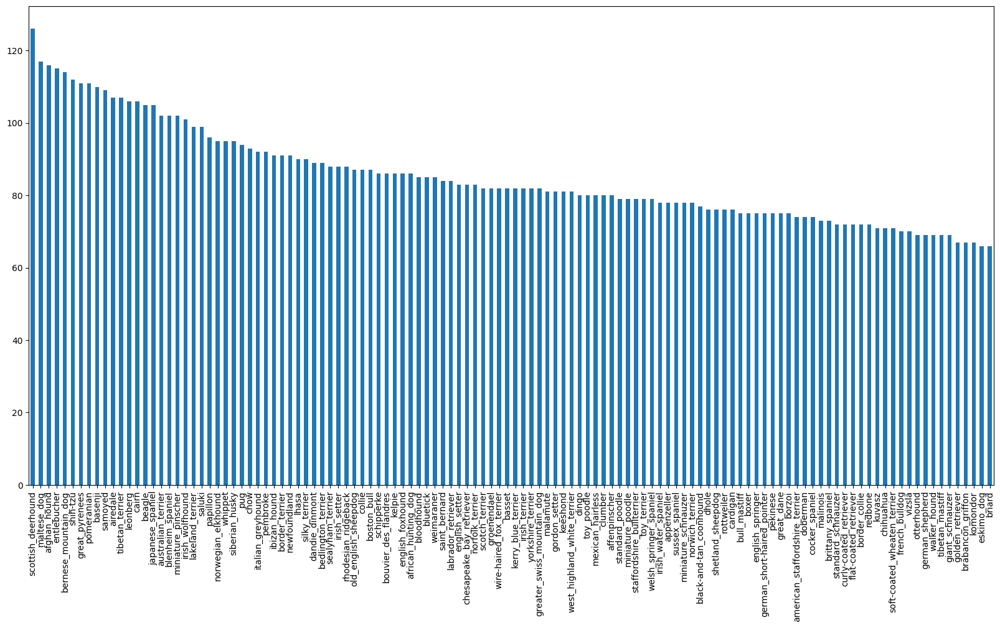

In [ ]:
label_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
# Median number of image per class
label_csv["breed"].value_counts().median()

82.0

Getting images and their labels

In [ ]:
# Creating pathnames from image ID's
filenames = ["/content/drive/MyDrive/dog-vision/dog-breed-identification/train/" + fname for fname in label_csv["id"] + ".jpg"]
filenames[:10]

['/content/drive/MyDrive/dog-vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-

In [ ]:
# Checking if number of ids are equal to number of imgs
import os
if len(os.listdir("/content/drive/MyDrive/dog-vision/dog-breed-identification/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


In [ ]:
labels = label_csv["breed"].to_numpy()
len(labels)

10222

In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Turning boolelan arrays into integers
X = filenames
y = boolean_labels

We are first starting with 1000 images

In [ ]:
NUM_IMAGES = 3000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Spliting data into train and validaiton sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(2400, 2400, 600, 600)

Preprocessing Images (truning images into tensors)

Take an image filepath as input
Use TensorFlow to read the file and save it to a variable, image
Turn our image (a jpg) into Tensors
Normalize our image (convert color channel values from from 0-255 to 0-1).
Resize the image to be a shape of (224, 224)
Return the modified image

In [ ]:
# Converting images to numpy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# turning image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  # Read in an image file
  image = tf.io.read_file(image_path)

  # turn jpeg image into numerical tensors with 3 color channels
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from 0-225 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

why turn data into batches?
if you try to process all the images together they might not fit in the memory

batch size is 32

In [ ]:
## Turning our data into batches

def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# This function turns data into batches
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):

  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels

  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                       tf.constant(y)))# labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                       tf.constant(y)))# labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
# Visualizing data batches

import matplotlib.pyplot as plt

def show_25_images(images, labels):

  plt.figure(figsize=(10, 10))

  for i in range(25):
    # Create 5 rows in 5 column subplots
    ax = plt.subplot(5,5, i+1)
    plt.imshow(images[i])

    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

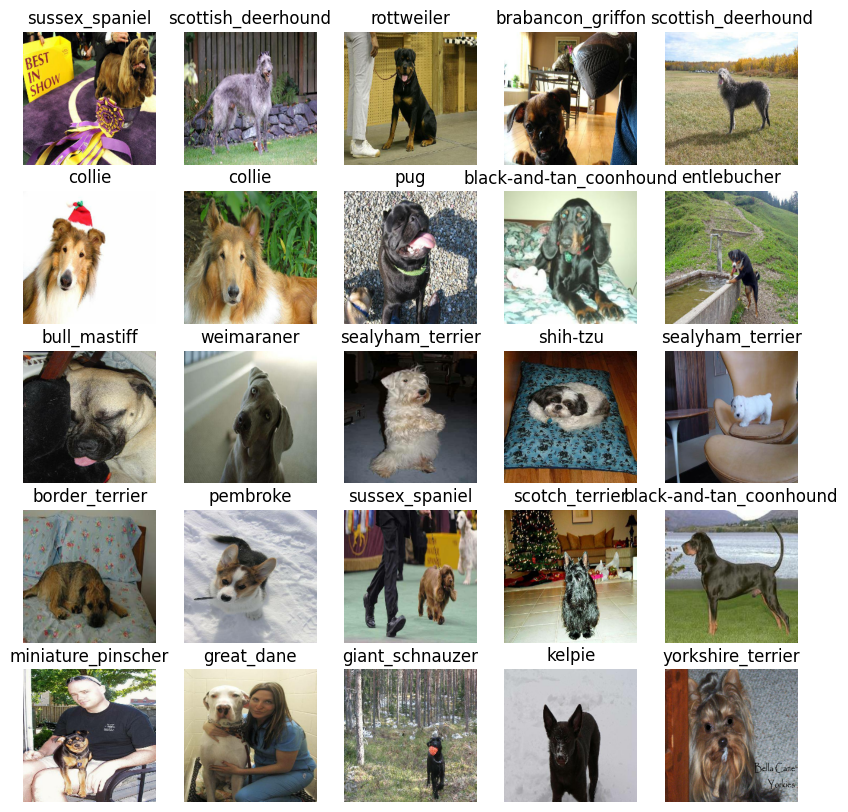

In [ ]:
# train the batch
train_images, train_labels = next(train_data.as_numpy_iterator())
# lets visualize our data in a training batch
show_25_images(train_images, train_labels)

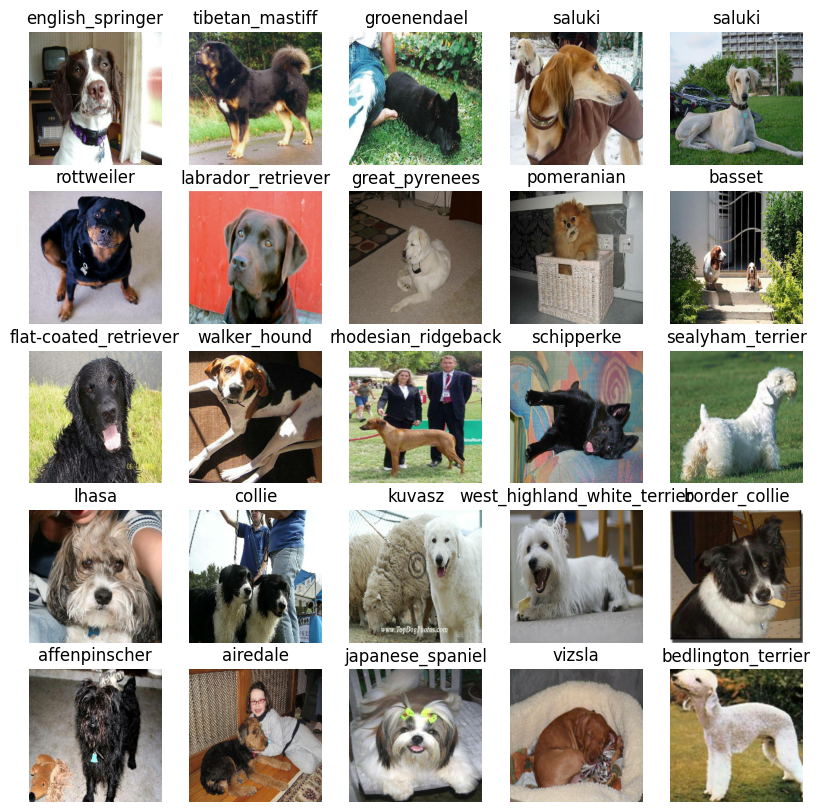

In [ ]:
# train the batch
val_images, val_labels = next(val_data.as_numpy_iterator())
# lets visualize our data in a training batch
show_25_images(val_images, val_labels)

Building a model
Before we build a model, there are a few things we need to define:

The input shape (our images shape, in the form of Tensors) to our model.
The output shape (image labels, in the form of Tensors) of our model.
The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5"

Deep Learning Recourses:
Tensorflow hu
pytorch
modelzoo
paperswhitecode

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

Takes the input shape, output shape and the model we've chosen as parameters.
Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
Compiles the model (says it should be evaluated and improved).
Builds the model (tells the model the input shape it'll be getting).
Returns the model.

All the steps can be found here: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5

In [ ]:
# Creating a function that build the keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("building model with:", MODEL_URL)

  # Steup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
      activation="softmax") # Layer 2 (output layer)
      # Sigmond for binary classification and softmax for multi-class classification
  ])

  # Compile the mdoel
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # CategoricalCrossentropy is the loss function for multi-class classification and BinaryCrossentropy is for binary classification
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5508713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,628,953
Trainable params: 120,240
Non-trainable params: 5,508,713
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1, 1, 1280))

## Creating Callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

In [ ]:
# TensorBoard Callback
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/dog-vision/dog-breed-identification/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stoping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stoping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

## Training a model (subset of data)
our first model is only going to train 1000 models to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Chek to make sure GPU is running
print("GPU", "available (YES)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available (YES)


## Let's create a function which trains a model.

Create a model using create_model()
Setup a TensorBoard callback using create_tensorboard_callback()
Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
Return the model

In [ ]:
def train_model():
  # Create a model
  model = create_model()

  # Create a new TensorBoard everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
# Fit model to data
model = train_model()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
Epoch 1/100
75/75 [==============================] - 134s 1s/step - loss: 3.0310 - accuracy: 0.3621 - val_loss: 1.3858 - val_accuracy: 0.6600
Epoch 2/100
75/75 [==============================] - 11s 151ms/step - loss: 0.6216 - accuracy: 0.8729 - val_loss: 0.9519 - val_accuracy: 0.7383
Epoch 3/100
75/75 [==============================] - 10s 131ms/step - loss: 0.2674 - accuracy: 0.9625 - val_loss: 0.8470 - val_accuracy: 0.7683
Epoch 4/100
75/75 [==============================] - 10s 137ms/step - loss: 0.1456 - accuracy: 0.9887 - val_loss: 0.8234 - val_accuracy: 0.7750
Epoch 5/100
75/75 [==============================] - 11s 140ms/step - loss: 0.0938 - accuracy: 0.9962 - val_loss: 0.8133 - val_accuracy: 0.7633
Epoch 6/100
75/75 [==============================] - 11s 153ms/step - loss: 0.0671 - accuracy: 0.9987 - val_loss: 0.7970 - val_accuracy: 0.7650
Epoch 7/100
75/75 [====================

## Cheking Tensorboard logs
the tensorboard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/dog-vision/dog-breed-identification/logs


Output hidden; open in https://colab.research.google.com to view.

Making and Evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

19/19 [==============================] - 2s 96ms/step


array([[2.21249138e-05, 2.94307447e-05, 7.43794080e-05, ...,
        1.72239103e-04, 3.22480832e-06, 3.75501659e-05],
       [3.40111932e-04, 1.39332158e-04, 3.32178111e-04, ...,
        5.36954067e-05, 6.16265825e-05, 3.84684354e-05],
       [2.87037710e-05, 1.21400972e-05, 1.11935915e-04, ...,
        8.87707131e-07, 8.42121426e-06, 1.92661787e-06],
       ...,
       [6.86648767e-04, 4.18386562e-03, 3.93436849e-03, ...,
        1.02677792e-02, 3.01724672e-03, 9.53027396e-04],
       [2.39641213e-06, 1.15603109e-06, 4.78914615e-07, ...,
        2.85982401e-06, 2.42262995e-05, 4.69424094e-07],
       [3.24831467e-06, 7.96748918e-06, 2.12033090e-04, ...,
        2.88618776e-05, 7.37283381e-06, 1.73164488e-04]], dtype=float32)

In [ ]:
predictions.shape # (images, proportion of similarity to each breed)

(600, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
len(unique_breeds)

120

In [ ]:
# First prediction
index = 1
print(predictions[index])
print(f"Max value: {np.max(predictions[index])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.40111932e-04 1.39332158e-04 3.32178111e-04 3.04936577e-04
 1.31889479e-04 1.28247950e-03 6.69805668e-05 5.09194506e-04
 1.49564494e-05 1.62831238e-05 5.44545264e-06 1.33434739e-02
 6.81610603e-04 2.65585277e-05 1.12763955e-03 4.77469672e-04
 5.74280275e-04 1.11997862e-04 2.88411884e-05 5.49352944e-06
 1.62543220e-04 7.29138206e-04 6.69282803e-04 3.63496336e-04
 7.32759145e-05 2.78531312e-04 1.89917864e-05 2.93733410e-05
 3.51389288e-04 1.87307360e-05 2.01752433e-03 6.20941457e-04
 2.57919291e-05 1.69410266e-03 2.99418825e-05 1.09529495e-03
 4.48896375e-04 3.17252066e-04 1.07452179e-05 1.71002539e-04
 1.13580529e-04 1.58372386e-05 5.45615389e-04 1.42374297e-03
 9.61231766e-04 1.68350343e-05 4.58129332e-04 1.47213912e-04
 6.88681394e-05 4.09193221e-04 5.79602143e-04 2.27934488e-05
 6.31548697e-04 2.79589207e-04 4.27518826e-04 6.16879726e-04
 4.44406578e-05 5.45398980e-05 6.49809881e-05 5.63235226e-05
 2.33120113e-06 8.93109664e-03 7.68332247e-05 4.85017314e-04
 3.08213603e-05 1.305672

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

Note: Prediction probabilities are also known as confidence levels.

In [ ]:
# Turning predicted probabilities into easy to understand labels
def get_pred_label(prediction_probabilities):

  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[1])

pred_label


'tibetan_mastiff'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# unbatching the dataset
def unbatchify(data):
  images = []
  labels = []

  # Loop through the unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.41326207, 0.41718364, 0.3544385 ],
         [0.36937293, 0.3732945 , 0.31054938],
         [0.38238448, 0.38630605, 0.32356092],
         ...,
         [0.85572916, 0.8988664 , 0.9216594 ],
         [0.81720906, 0.8603463 , 0.8760326 ],
         [0.87009096, 0.9132282 , 0.9289145 ]],
 
        [[0.41238695, 0.41630852, 0.3535634 ],
         [0.40000004, 0.4039216 , 0.34117648],
         [0.40333864, 0.4072602 , 0.3445151 ],
         ...,
         [0.96608555, 0.9984034 , 0.9996638 ],
         [0.937802  , 0.98093927, 0.99544823],
         [0.9232422 , 0.95921254, 0.96534306]],
 
        [[0.41683942, 0.420761  , 0.35801587],
         [0.39275387, 0.39667544, 0.3339303 ],
         [0.4052726 , 0.40919417, 0.34644905],
         ...,
         [0.93628675, 0.9760188 , 0.98673296],
         [0.788624  , 0.8290739 , 0.8393855 ],
         [0.8861353 , 0.92658526, 0.93689686]],
 
        ...,
 
        [[0.3655635 , 0.25968117, 0.2322302 ],
         [0.38517138, 0.279289  , 0.25183

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'english_springer'

Making the predictions visual

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

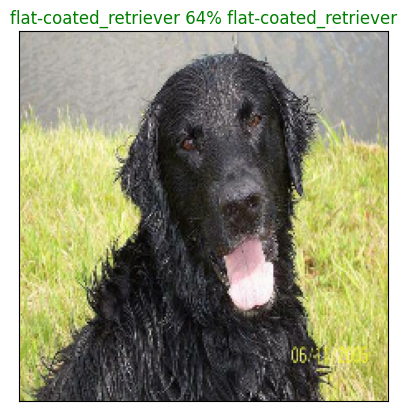

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=10)

In [ ]:
# This function is for ploting the top 10 predictions
def plot_pred_conf(prediction_probabilities, labels, n=0):

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 predictions confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
predictions[1][predictions[1].argsort()[-10:][::-1]]

array([0.92134666, 0.01334347, 0.0089311 , 0.00512528, 0.00287145,
       0.00247847, 0.00239016, 0.00201752, 0.00177422, 0.0016941 ],
      dtype=float32)

In [ ]:
unique_breeds[predictions[1].argsort()[-10:][::-1]]

array(['tibetan_mastiff', 'bernese_mountain_dog', 'japanese_spaniel',
       'maltese_dog', 'newfoundland', 'tibetan_terrier', 'rottweiler',
       'chow', 'siberian_husky', 'collie'], dtype=object)

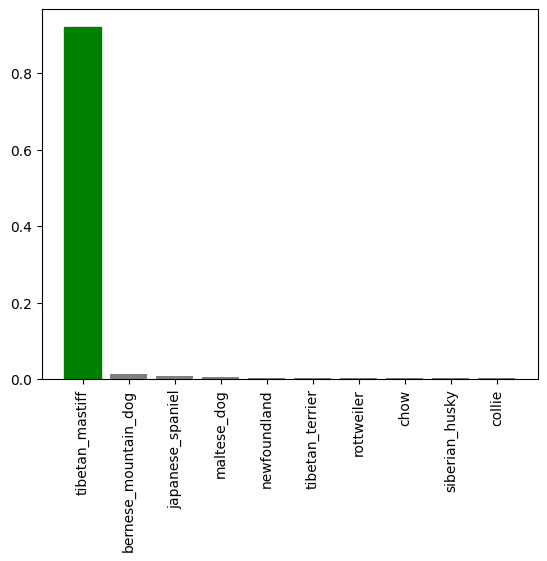

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=1)

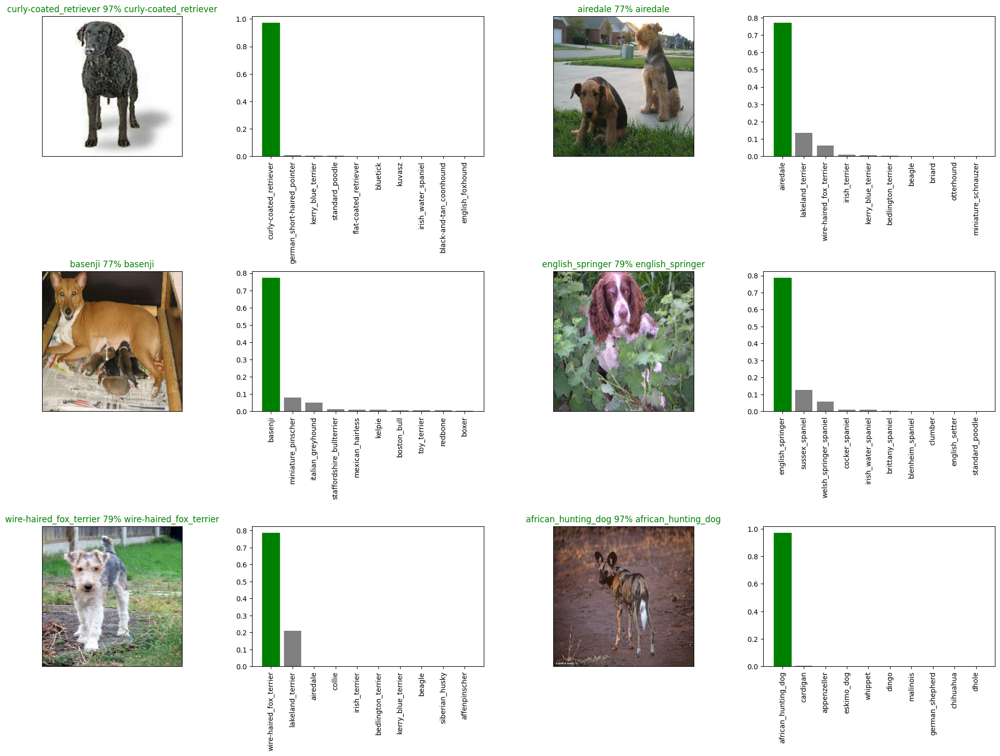

In [ ]:
# Cheking the predictions and their different values
i_multiplier = 30
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
def save_model(model, suffix=None):

  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/dog-vision/dog-breed-identification/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  print(f"Loading the saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Saving our model trained on 3000 images
save_model(model, suffix="1000-images-mobilenetv3-Arad")

'/content/drive/MyDrive/dog-vision/dog-breed-identification/models/20230827-15291693150195-1000-images-mobilenetv3-Arad.h5'

In [ ]:
# Loading our model trained on 3000 images
loaded_3000_image_model = load_model("/content/drive/MyDrive/dog-vision/dog-breed-identification/models/20230826-00471693010832-1000-images-mobilenetv3-Arad.h5")

Loading the saved model from: /content/drive/MyDrive/dog-vision/dog-breed-identification/models/20230826-00471693010832-1000-images-mobilenetv3-Arad.h5


In [ ]:
loaded_3000_image_model.evaluate(val_data)

19/19 [==============================] - 2s 89ms/step - loss: 0.7859 - accuracy: 0.7717


[0.7859038710594177, 0.7716666460037231]

In [ ]:
# Create a data batch with the whole data
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
# Create a model for full model
full_model = create_model()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we cant monitor validation accuracy
full_mdoel_early_stopping= tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_mdoel_early_stopping])

Epoch 1/100
320/320 [==============================] - 42s 111ms/step - loss: 1.3653 - accuracy: 0.6671
Epoch 2/100
320/320 [==============================] - 34s 106ms/step - loss: 0.3880 - accuracy: 0.8876
Epoch 3/100
320/320 [==============================] - 35s 110ms/step - loss: 0.2229 - accuracy: 0.9406
Epoch 4/100
320/320 [==============================] - 35s 108ms/step - loss: 0.1393 - accuracy: 0.9680
Epoch 5/100
320/320 [==============================] - 36s 113ms/step - loss: 0.0960 - accuracy: 0.9821
Epoch 6/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0672 - accuracy: 0.9896
Epoch 7/100
320/320 [==============================] - 38s 118ms/step - loss: 0.0512 - accuracy: 0.9947
Epoch 8/100
320/320 [==============================] - 36s 111ms/step - loss: 0.0403 - accuracy: 0.9968
Epoch 9/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0321 - accuracy: 0.9983
Epoch 10/100
320/320 [==============================] - 45s 142m

In [ ]:
save_model(full_model, suffix="1000-images-mobilenetv3-Arad")

'/content/drive/MyDrive/dog-vision/dog-breed-identification/models/20230827-15431693151019-1000-images-mobilenetv3-Arad.h5'

In [ ]:
loaded_full_model = load_model('/content/drive/MyDrive/dog-vision/dog-breed-identification/models/20230827-15431693151019-1000-images-mobilenetv3-Arad.h5')

Loading the saved model from: /content/drive/MyDrive/dog-vision/dog-breed-identification/models/20230827-15431693151019-1000-images-mobilenetv3-Arad.h5


## Making predictions on the test images

In [ ]:
# Load the test images file names
test_path = "/content/drive/MyDrive/dog-vision/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames


['/content/drive/MyDrive/dog-vision/dog-breed-identification/test/e138d8e5745db1213cc08131e7420c7a.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/test/e2915c191c0bc761b795b78f66845fe0.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/test/e7041fdc87517192097e62b3822309b7.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/test/dd8c716a81edb1cac3d4cb2b6c47880a.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/test/e0f9b92adbba451d296678f466732969.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/test/e4b8eb057df510fa776516de19c9fa92.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/test/e24877545b682257ca77ae600df1fe37.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/test/e06ce40d62d3d198f2df70349104a002.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identific

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predicitons on the test data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 180s 536ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
#np.savetxt("/content/drive/MyDrive/dog-vision/dog-breed-identification/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/dog-vision/dog-breed-identification/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[3.38532952e-11, 1.60844088e-10, 7.63984986e-11, ...,
        1.21105326e-09, 9.80277082e-10, 2.68647955e-06],
       [2.78764400e-10, 2.67291433e-08, 6.43733566e-10, ...,
        1.09259197e-07, 4.71178696e-09, 1.22764004e-11],
       [5.51723067e-09, 4.58444088e-10, 3.96364186e-08, ...,
        4.57291804e-08, 1.46731897e-11, 3.51621487e-09],
       ...,
       [2.13124540e-09, 1.14286263e-06, 5.14959297e-10, ...,
        1.04934649e-07, 1.53894068e-11, 1.33221720e-05],
       [1.90799278e-06, 1.88828981e-05, 2.28992647e-09, ...,
        1.63662662e-06, 2.95027967e-08, 1.86435223e-08],
       [2.77369360e-11, 2.66545339e-06, 1.22138177e-09, ...,
        2.63732064e-10, 6.07164180e-11, 1.62841650e-11]])

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
# Preparing our data frame for kaggle submission
# Creating an empty pandas data frame
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ids to the data frame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e138d8e5745db1213cc08131e7420c7a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e2915c191c0bc761b795b78f66845fe0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7041fdc87517192097e62b3822309b7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,dd8c716a81edb1cac3d4cb2b6c47880a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e0f9b92adbba451d296678f466732969,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e138d8e5745db1213cc08131e7420c7a,3.385330e-11,1.608441e-10,7.639850e-11,3.531424e-07,1.644052e-07,7.969984e-08,2.250675e-05,1.905638e-07,9.601312e-10,...,5.319014e-09,1.302958e-09,1.916783e-09,2.337785e-08,2.899716e-11,1.538670e-08,2.279118e-08,1.211053e-09,9.802771e-10,2.686480e-06
1,e2915c191c0bc761b795b78f66845fe0,2.787644e-10,2.672914e-08,6.437336e-10,1.294285e-09,2.557070e-11,3.457985e-12,8.335284e-10,5.411229e-12,3.703696e-09,...,1.569200e-07,2.051379e-10,1.714080e-10,2.422992e-09,1.099363e-07,1.957647e-08,3.160134e-10,1.092592e-07,4.711787e-09,1.227640e-11
2,e7041fdc87517192097e62b3822309b7,5.517231e-09,4.584441e-10,3.963642e-08,2.990222e-10,5.271126e-10,3.943796e-07,6.262377e-10,3.508518e-09,3.894977e-09,...,2.107901e-10,1.661245e-11,1.759032e-09,6.382889e-08,7.356904e-10,7.521236e-09,3.977251e-08,4.572918e-08,1.467319e-11,3.516215e-09
3,dd8c716a81edb1cac3d4cb2b6c47880a,5.852130e-08,8.921403e-09,1.657375e-09,5.458985e-06,5.885407e-07,1.698045e-09,1.087398e-09,1.049517e-09,5.179676e-09,...,2.392750e-06,3.067893e-08,3.337073e-07,8.236636e-10,2.832105e-07,1.897853e-06,5.998156e-09,1.704067e-07,2.483162e-08,1.526633e-06
4,e0f9b92adbba451d296678f466732969,2.586623e-09,2.413403e-10,4.153452e-10,4.374953e-10,2.990858e-08,7.552127e-05,1.071635e-04,9.960580e-01,1.963526e-08,...,4.312984e-08,3.491980e-03,2.262933e-08,3.272703e-07,8.290778e-10,2.352525e-07,4.327703e-07,2.465916e-08,8.176188e-06,2.239407e-09


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/dog-vision/dog-breed-identification/full_model_predictions_submission_1_mobilenetV3.csv",
                index=False)

In [ ]:
# Get custom image dog path
custom_path = "/content/drive/MyDrive/dog-vision/dog-breed-identification/my-dog-photos/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_path

['/content/drive/MyDrive/dog-vision/dog-breed-identification/my-dog-photos/download1.jpeg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/my-dog-photos/download2.jpeg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification/my-dog-photos/download.jpeg']

In [ ]:
# Turn custom images into batch data set
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# making predictions
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['african_hunting_dog', 'english_springer', 'afghan_hound']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

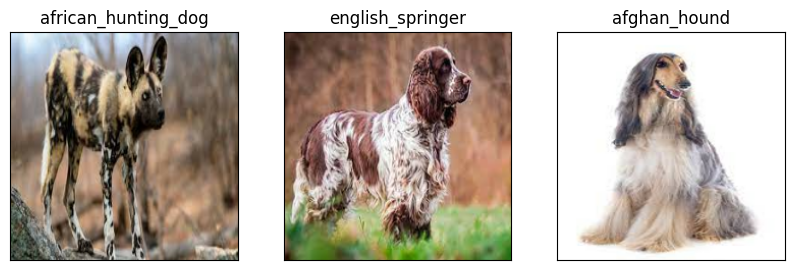

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)